<a href="https://colab.research.google.com/github/D2501R2003/From-Data-to-Decisions-Deep-Learning-Frameworks-for-Business-Case-Analysis/blob/main/FuncAnimation_Spring(Car_Shock_Absorber).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

In [2]:
m = 1 # kg
k = 10 # N/m
d = 0.2 # unit of d


In [3]:
t = np.linspace(0,40, 501)
w_d = np.sqrt((4*m*k - d**2)/(4*m**2))
x = np.exp(-d/(2*m) * t)* np.cos(w_d *t)

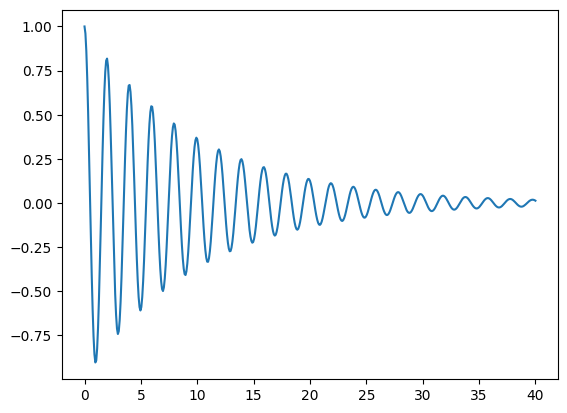

In [4]:
fig, axis = plt.subplots()
axis.plot(t, x)

plt.show()

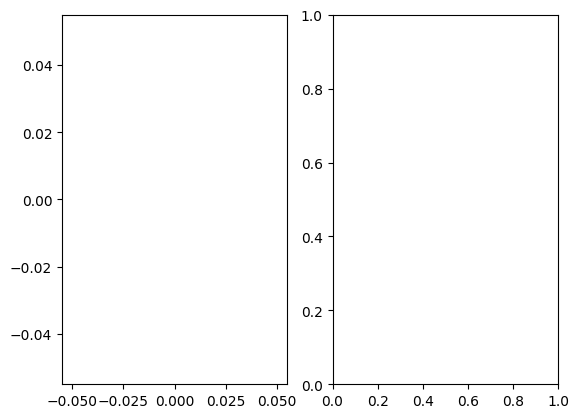

In [5]:
# --- Creating a figure and Axis with Additional configurations and styling of the plot: ---#

fig,axis = plt.subplots(1, 2)
animated_spring, = axis[0].plot([],[], color = 'blue') #',' is used because axis.plot returns an array

animated_mass, = axis[0].plot([],[],'o', markersize = 4, color = 'red') #',' is used because axis.plot returns an array


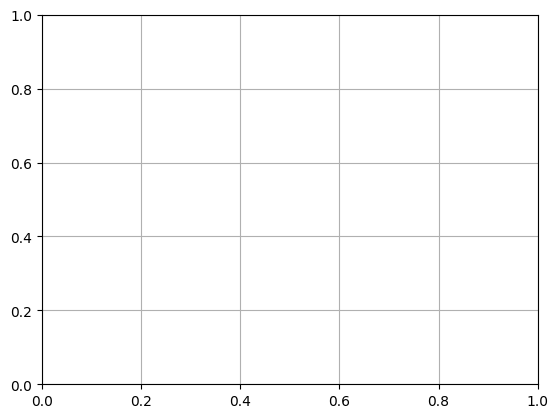

In [6]:
# Setting the xlim and ylim
axis[0].set_xlim([-2, 2])
axis[0].set_ylim([-2, 2])
axis[0].grid()
# axis.set_title("A dummy title") (optional)

animated_disp, = axis[1].plot([], [], color = 'red')
axis[1].set_xlim([min(t), max(t)])
axis[1].set_ylim([-2, 2])
axis[1].grid()

plt.grid()

In [7]:
from matplotlib import animation
# --- Defining our update function - - - #

def update(frame):
  animated_mass.set_data([x[frame]], [0]) # Updating the data across [frame]
  animated_spring.set_data([-2, x[frame]], [0, ]) # Updating the data across [frame]

  animated_spring.set_linewidth(int(abs(x[frame]-2)*2))

  animated_disp.set_data(t[:frame], x[:frame])

  return animated_mass, animated_spring, animated_disp

animation = FuncAnimation(
                fig = fig,
                func = update,
                frames = len(t),
                interval = 25,
                blit = True) # rest of arguments

animation.save("animation_pendulum.gif")
from IPython.display import HTML

HTML(animation.to_jshtml())